<a href="https://colab.research.google.com/github/rtegao/CNN-Specialization/blob/master/N02BE_Forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

In the EDA Notebook, I verified that the drug N02BE have the highest sales volume, so now, in this notebook, I'll try to predict the 5 days of future sales from this specific drug.



# Libraries

In [0]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras import optimizers, regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# One Feature

## Importing

In [0]:
df_daily = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/salesdaily.csv')
# df_daily = df_daily[['datum','Weekday Name','N02BE']]
# df_daily.columns = ['data','weekday','N02BE']

df_daily = df_daily['N02BE']


# df_houly = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/saleshourly.csv')
# df_monthly = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/salesmonthly.csv')
# df_weekly = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/salesweekly.csv')

## Spliting Data

In [0]:
def dataSplit(df,train_percent,val_percent):
  train_limit = int(round((df.shape[0])*train_percent,0))
  val_limit = int(round((df.shape[0])*(train_percent+val_percent),0))
  
  df_train = df[:train_limit]
  df_val = df[train_limit:val_limit]
  df_test = df[val_limit:]

  print(df_train.shape)
  print(df_val.shape)
  print(df_test.shape)

  return df_train,df_val,df_test

In [4]:
df_train,df_val,df_test = dataSplit(df = df_daily,train_percent = 0.7,val_percent = 0.15)

(1474,)
(316,)
(316,)


## Normalizing Data

In [0]:
def normalizing_data(df_train,df_val,df_test):
  try:
    data_list = [df_train.copy(),df_val.copy(),df_test.copy()]
    min_list = df_train.min(axis=0)
    max_list = df_train.max(axis=0)
    for j in range(len(data_list)):
      for i in range(df_train.shape[1]):
        data_list[j].iloc[:,i] = (data_list[j].iloc[:,i]-min_list[i])/abs((min_list[i]-max_list[i]))
      data_list[j] = data_list[j].values
  except:
    df_train = df_train.values.reshape(-1,1)
    df_val = df_val.values.reshape(-1,1)
    df_test = df_test.values.reshape(-1,1)

    data_list = [df_train.copy(),df_val.copy(),df_test.copy()]
    min_list = df_train.min(axis=0)
    max_list = df_train.max(axis=0)
    for j in range(3):
      for i in range(df_train.shape[1]):
        data_list[j][:,i] = (data_list[j][:,i]-min_list[i])/abs((min_list[i]-max_list[i]))

  df_train_norm = data_list[0].copy()
  df_val_norm = data_list[1].copy()
  df_test_norm = data_list[2].copy()

  print(df_train_norm.max(axis=0))
  print(df_train_norm.min(axis=0))
  print('\n')

  print(df_val_norm.max(axis=0))
  print(df_val_norm.min(axis=0))
  print('\n')

  print(df_test_norm.max(axis=0))
  print(df_test_norm.min(axis=0))

  print('-------------------------')

  print(df_train_norm.shape)
  print(df_val_norm.shape)
  print(df_test_norm.shape)
  return df_train_norm,df_val_norm,df_test_norm

In [6]:
df_train_norm,df_val_norm,df_test_norm = normalizing_data(df_train,df_val,df_test)

[1.]
[0.]


[0.46335404]
[0.]


[0.62173913]
[0.]
-------------------------
(1474, 1)
(316, 1)
(316, 1)


## Preprocessing

In [0]:
def Regressor(future_steps,time_steps,n_features,df_train,df_val,df_test):
  # future_steps: how many days in the furure to predict 
  # time_steps: number of samples the LSTM model will use for predict 28 days in the future
  # n_features: number of features (LSTM input) 

  #################### TRAIN #################################################
  # Defining the number of samples for the train data
  n_samples = df_train.shape[0]
  x_train = []
  y_train = []

  # shaping data to have the number of time_steps in the x_train ans the 28 future values in the y_train 
  for i in range(time_steps,n_samples - time_steps): 
    x_train.append(df_train[i - time_steps : i, :]) 
    y_train.append(df_train[i : i+future_steps,-1]) 

  x_train,y_train = np.array(x_train),np.array(y_train) # transforming in array
  # LSTM need 3D tensor as input 
  x_train = np.reshape(x_train,(x_train.shape[0],x_train.shape[1],n_features))  

  ##################### VALIDATION ###############################################

  df_val = np.concatenate((df_train[-time_steps:],df_val))

  n_samples = df_val.shape[0]
  x_val = []
  y_val = []

  for i in range(time_steps,n_samples - time_steps):
    x_val.append(df_val[i - time_steps : i, :]) 
    y_val.append(df_val[i : i+future_steps,-1]) 

  x_val,y_val = np.array(x_val),np.array(y_val)
  x_val = np.reshape(x_val,(x_val.shape[0],x_val.shape[1],n_features))

  ####################### TEST ################################################

  df_test = np.concatenate((df_val[-time_steps:],df_test))
  n_samples = df_test.shape[0]
  x_test = []
  y_test = []

  for i in range(time_steps,n_samples - time_steps):
    x_test.append(df_test[i - time_steps : i, :]) 
    y_test.append(df_test[i : i+future_steps,-1]) 

  x_test,y_test = np.array(x_test),np.array(y_test)
  x_test = np.reshape(x_test,(x_test.shape[0],x_test.shape[1],n_features))

  x_train = x_train.astype(np.float32)
  y_train = y_train.astype(np.float32)

  x_val = x_val.astype(np.float32)
  y_val = y_val.astype(np.float32)

  x_test = x_test.astype(np.float32)
  y_test = y_test.astype(np.float32)
  
  return x_train,x_test,x_val,y_train,y_val,y_test

In [0]:
time_steps = 60
future_steps = 5
n_features = df_train_norm.shape[1]
x_train,x_test,x_val,y_train,y_val,y_test = Regressor(future_steps = future_steps,time_steps = time_steps,n_features = n_features,df_train = df_train_norm,df_val = df_val_norm,df_test = df_test_norm)

## LSTM

### Frist Try

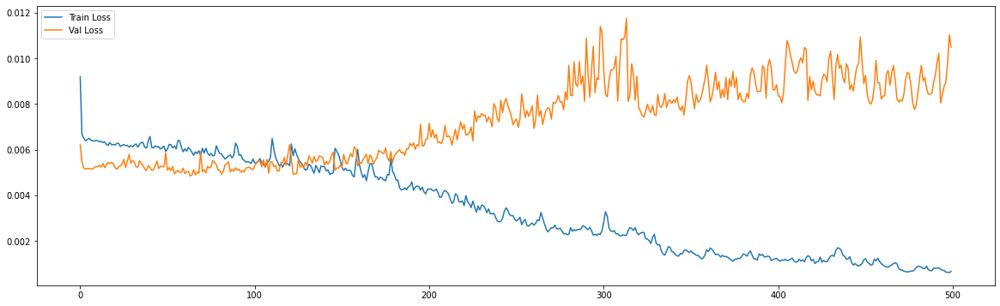

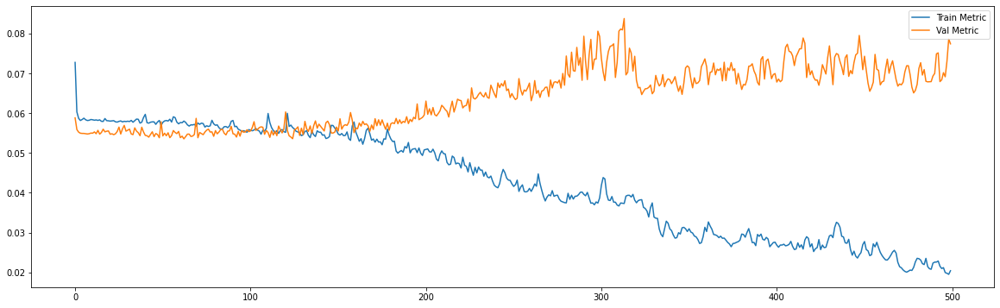



43/43 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0297
loss and metric train data [0.0013878676109015942, 0.029737455770373344]
8/8 [==============================] - 0s 3ms/step - loss: 0.0105 - mae: 0.0774
loss and metric val data [0.01048873458057642, 0.07740900665521622]
8/8 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0765
loss and metric test data [0.009443388320505619, 0.07651247829198837]


In [10]:
regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
adam = optimizers.Adam(lr = 0.01, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

# early stop
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=60, verbose = 0, shuffle= False
                        # , callbacks=[es]
                        )

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

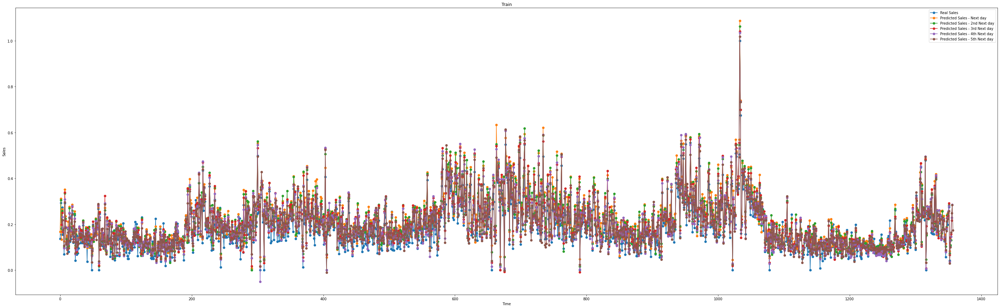

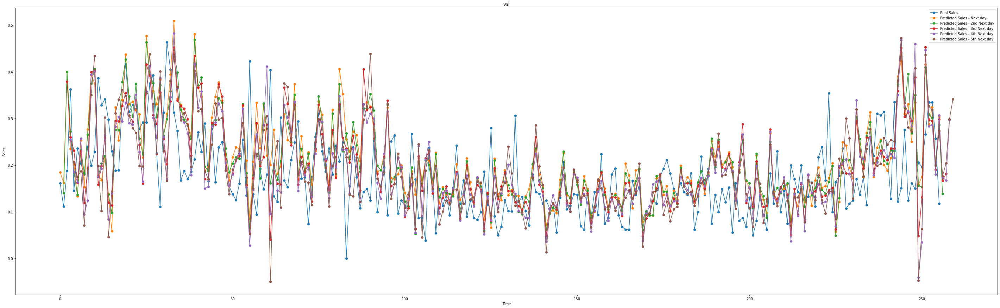

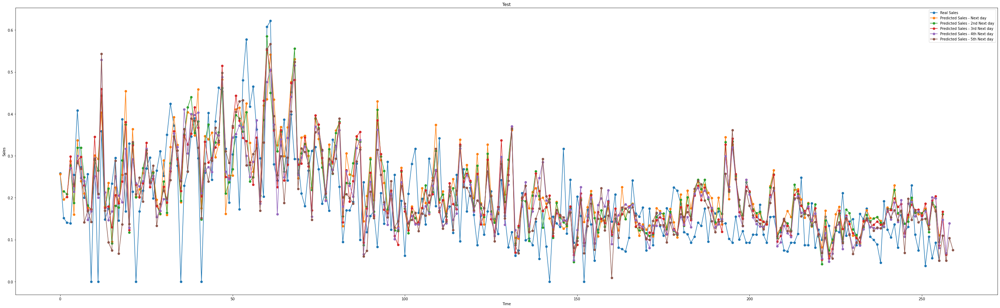

In [11]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train[:,0],marker='o',label='Real Sales')
plt.plot(y_train_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_train_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_train_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_train_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_train_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Train')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val[:,0],marker='o',label='Real Sales')
plt.plot(y_val_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_val_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_val_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_val_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_val_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Val')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_test[:,0],marker='o',label='Real Sales')
plt.plot(y_test_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_test_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_test_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_test_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_test_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Test')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Decreasing Learning Rate

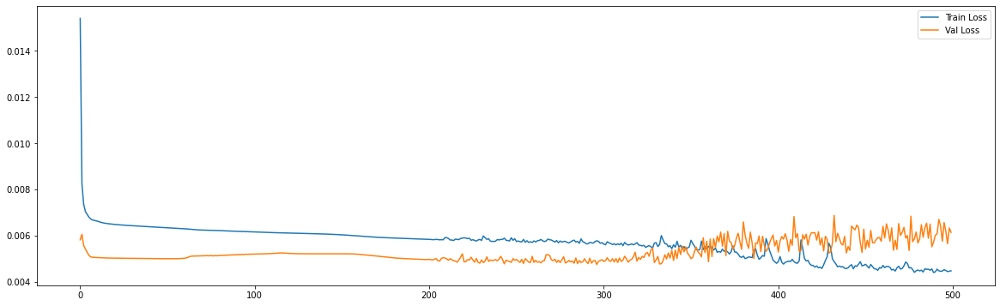

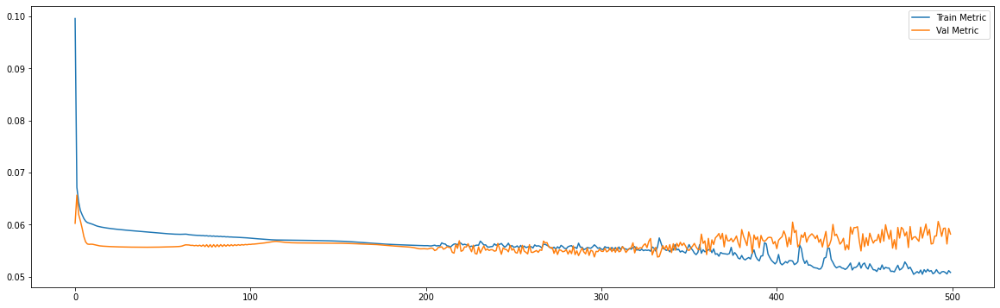



43/43 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0508
loss and metric train data [0.004572730045765638, 0.05080604925751686]
8/8 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0582
loss and metric val data [0.006137678399682045, 0.05817970633506775]
8/8 [==============================] - 0s 2ms/step - loss: 0.0085 - mae: 0.0693
loss and metric test data [0.008456112816929817, 0.06929782778024673]


In [12]:
del regressor
regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

# early stop
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=60, verbose = 0, shuffle= False
                        # , callbacks=[es]
                        )

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

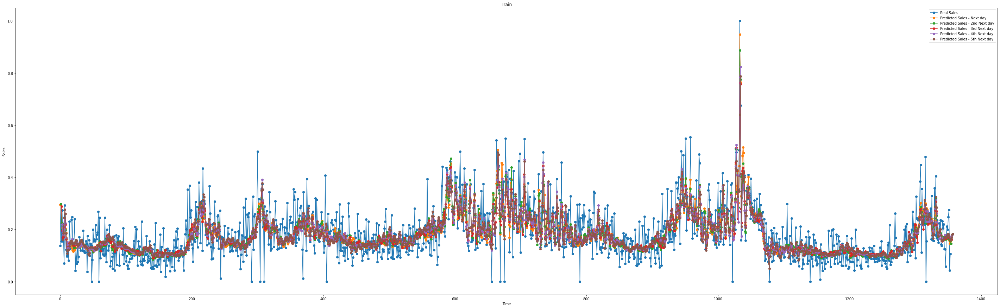

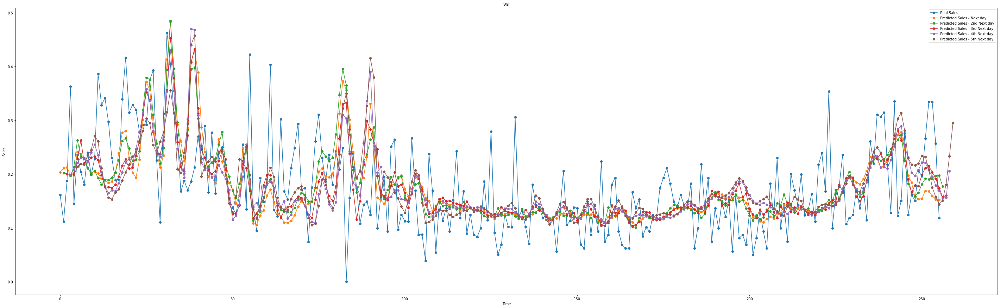

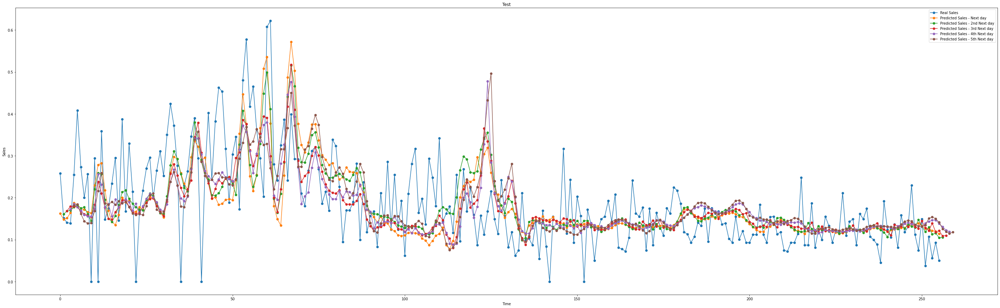

In [13]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train[:,0],marker='o',label='Real Sales')
plt.plot(y_train_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_train_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_train_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_train_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_train_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Train')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val[:,0],marker='o',label='Real Sales')
plt.plot(y_val_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_val_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_val_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_val_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_val_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Val')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_test[:,0],marker='o',label='Real Sales')
plt.plot(y_test_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_test_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_test_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_test_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_test_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Test')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Dropout

---

Learning rate = 0.001 it's a better option.

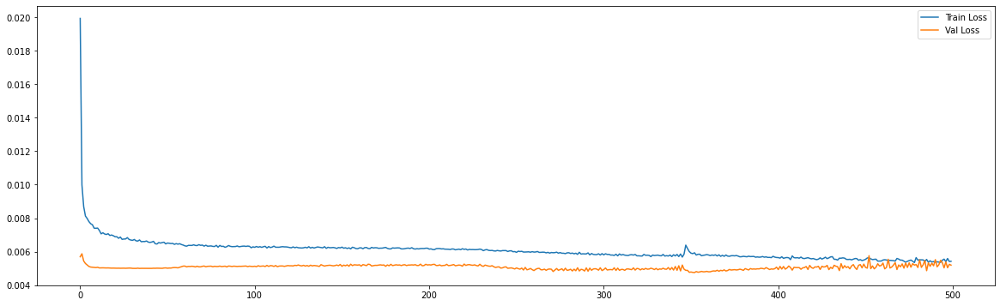

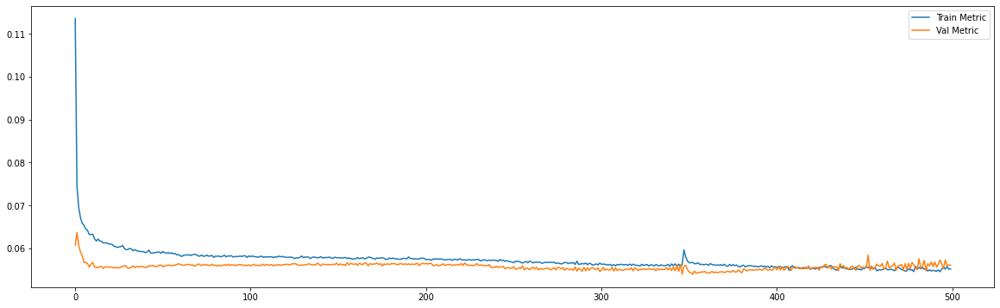



43/43 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0539
loss and metric train data [0.005150170996785164, 0.05394894257187843]
8/8 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0560
loss and metric val data [0.005197692662477493, 0.05602819100022316]
8/8 [==============================] - 0s 3ms/step - loss: 0.0081 - mae: 0.0643
loss and metric test data [0.008098219521343708, 0.06434083729982376]


In [16]:
del regressor
regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dropout(0.3))
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

# early stop
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=60, verbose = 0, shuffle= False
                        # , callbacks=[es]
                        )

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

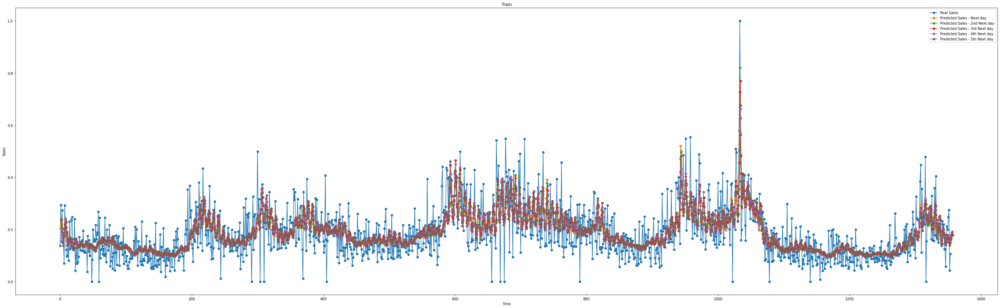

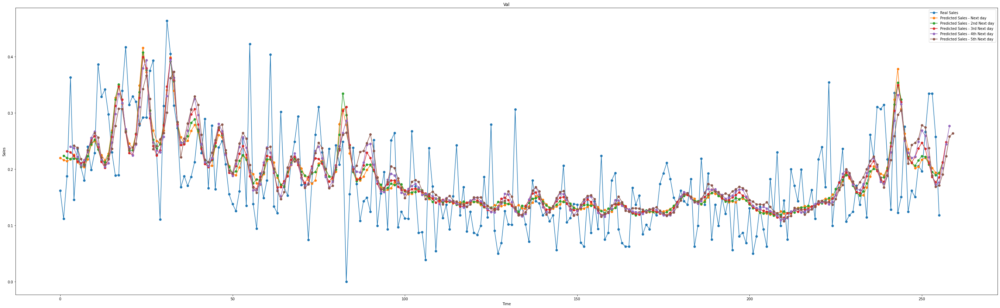

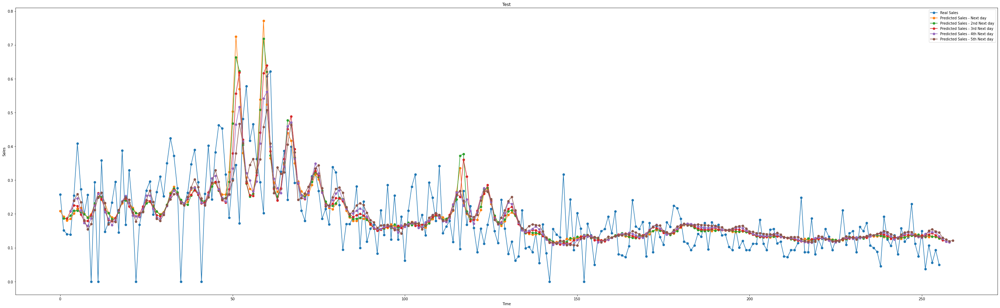

In [17]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train[:,0],marker='o',label='Real Sales')
plt.plot(y_train_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_train_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_train_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_train_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_train_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Train')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val[:,0],marker='o',label='Real Sales')
plt.plot(y_val_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_val_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_val_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_val_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_val_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Val')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_test[:,0],marker='o',label='Real Sales')
plt.plot(y_test_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_test_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_test_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_test_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_test_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Test')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Decreasing model complexit

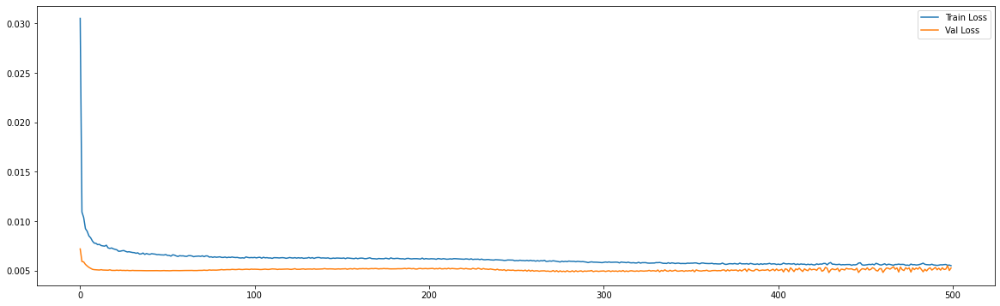

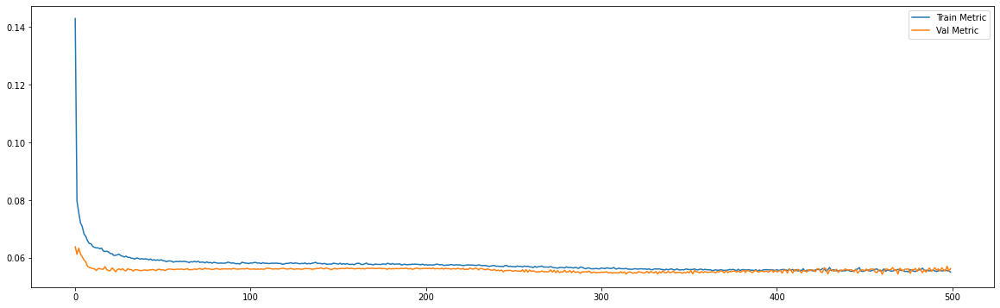



43/43 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0542
loss and metric train data [0.005321422591805458, 0.05420359596610069]
8/8 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0563
loss and metric val data [0.005264055449515581, 0.05629555508494377]
8/8 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0658
loss and metric test data [0.007791349198669195, 0.06575164943933487]


In [21]:
del regressor
regressor = Sequential()
regressor.add(LSTM(units=30, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dropout(0.3))
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

# early stop
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=60, verbose = 0, shuffle= False
                        # , callbacks=[es]
                        )

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

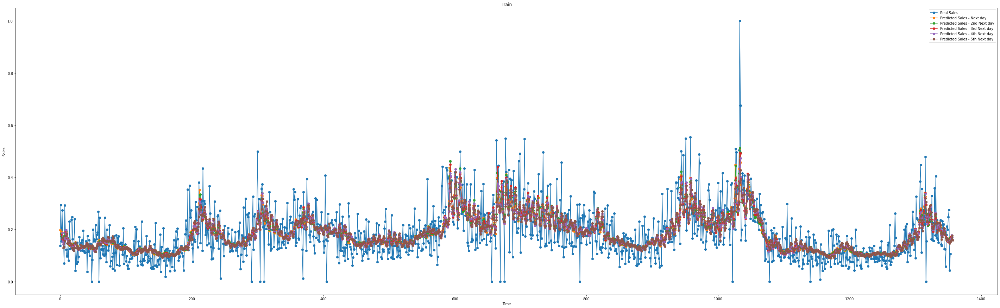

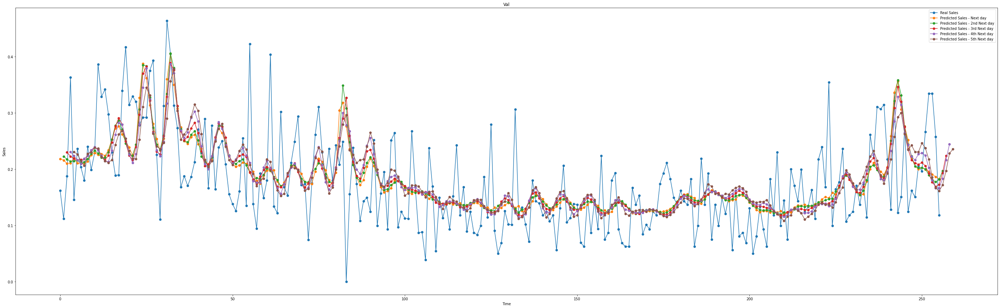

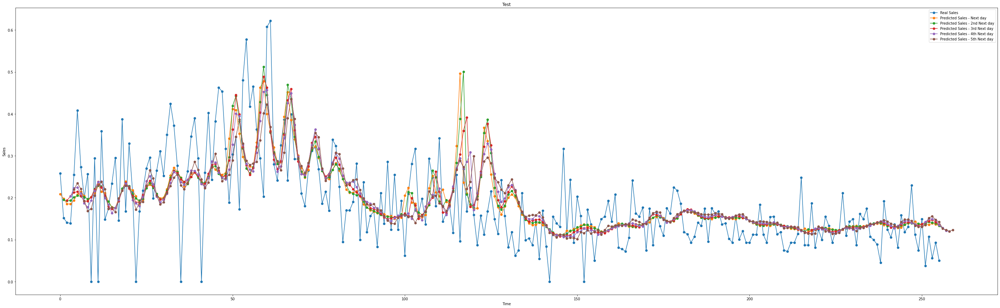

In [22]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train[:,0],marker='o',label='Real Sales')
plt.plot(y_train_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_train_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_train_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_train_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_train_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Train')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val[:,0],marker='o',label='Real Sales')
plt.plot(y_val_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_val_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_val_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_val_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_val_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Val')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_test[:,0],marker='o',label='Real Sales')
plt.plot(y_test_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_test_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_test_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_test_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_test_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Test')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Variations

Epoch 00162: early stopping
============================model:0===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0567
loss and metric train data [0.006100926548242569, 0.056665923446416855]
9/9 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0569
loss and metric val data [0.0053095743060112, 0.05688904598355293]
9/9 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0588
loss and metric test data [0.006303997244685888, 0.05878710001707077]


'neurons': 30, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




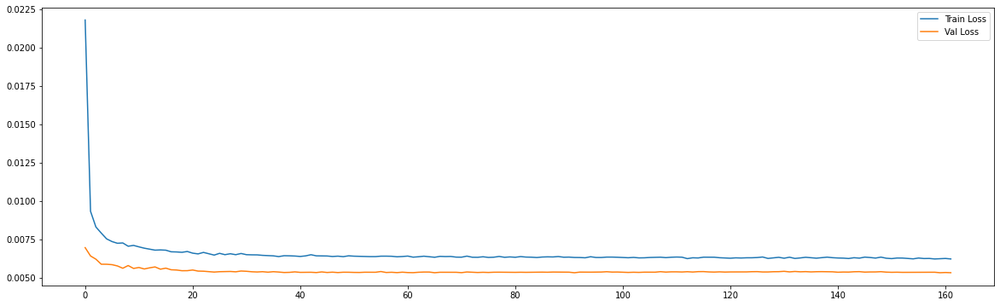

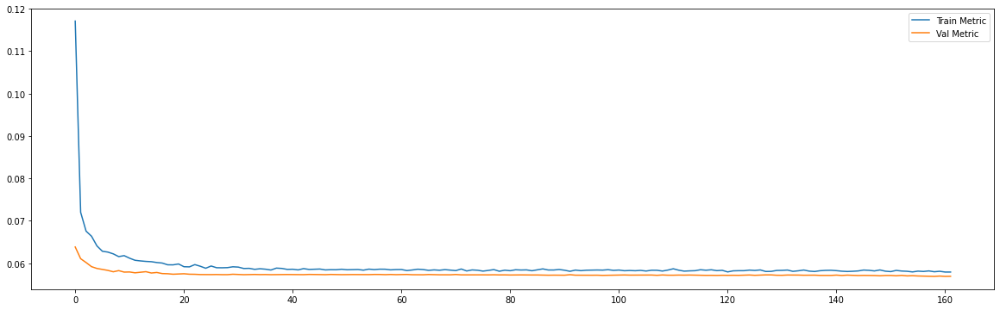

Epoch 00131: early stopping
============================model:1===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0568
loss and metric train data [0.0061707692220807076, 0.05680450052022934]
9/9 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0570
loss and metric val data [0.005371237639337778, 0.056963421404361725]
9/9 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0588
loss and metric test data [0.006406181957572699, 0.05883022025227547]


'neurons': 30, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




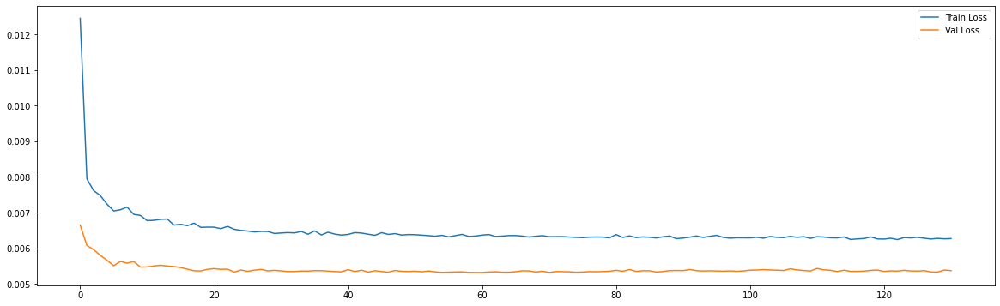

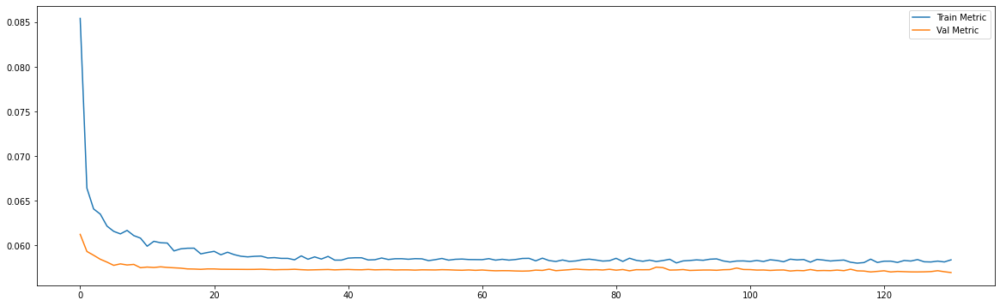

Epoch 00112: early stopping
============================model:2===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0571
loss and metric train data [0.0061083268374204636, 0.05712136626243591]
8/8 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0563
loss and metric val data [0.005189371295273304, 0.05627739802002907]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0634
loss and metric test data [0.007137578912079334, 0.06336670368909836]


'neurons': 30, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




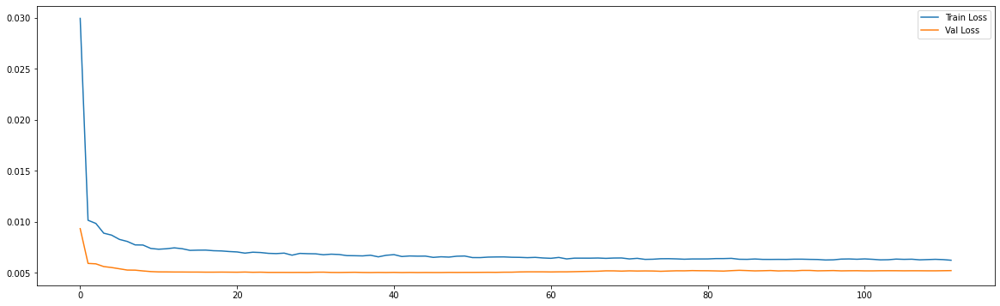

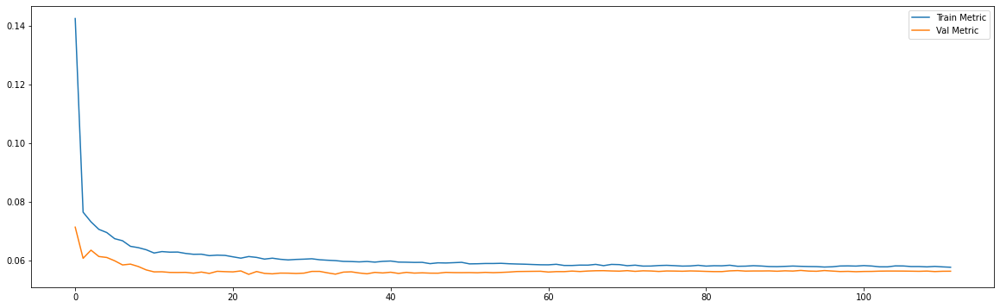

Epoch 00109: early stopping
============================model:3===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0062 - mae: 0.0572
loss and metric train data [0.006150559987872839, 0.05716058611869812]
8/8 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0558
loss and metric val data [0.005080080591142178, 0.05584591254591942]
8/8 [==============================] - 0s 3ms/step - loss: 0.0070 - mae: 0.0628
loss and metric test data [0.006974628195166588, 0.06282258778810501]


'neurons': 30, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




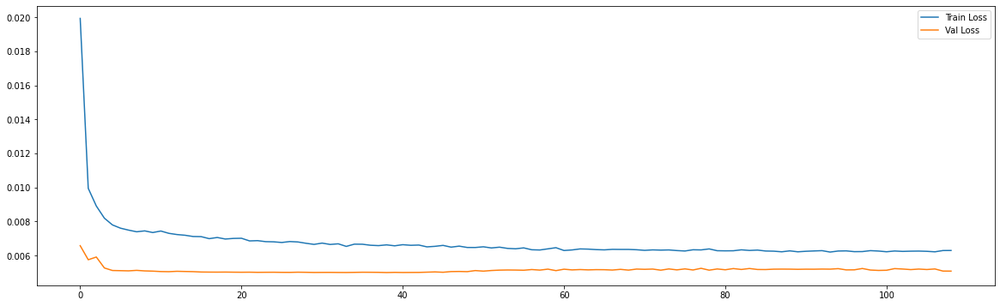

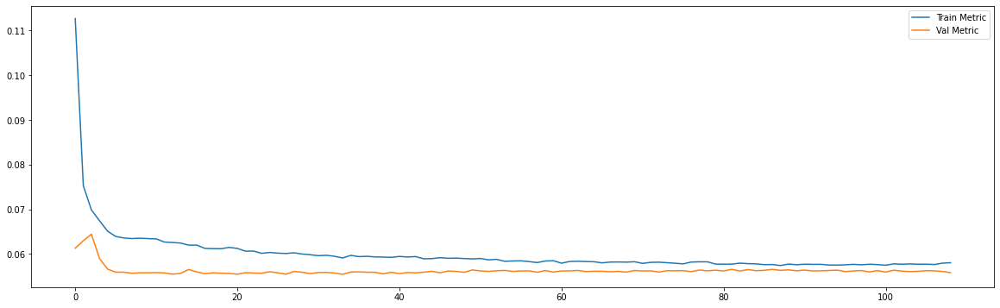

Epoch 00138: early stopping
============================model:4===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0573
loss and metric train data [0.0061621651984751225, 0.057306911796331406]
7/7 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0551
loss and metric val data [0.00509276008233428, 0.05512339249253273]
7/7 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0713
loss and metric test data [0.008587103337049484, 0.07133466005325317]


'neurons': 30, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




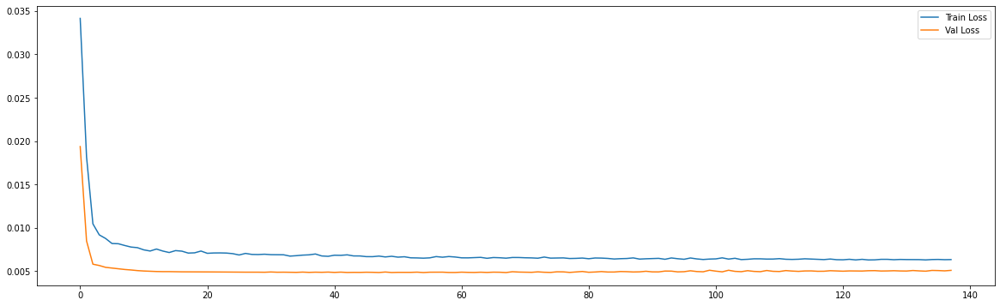

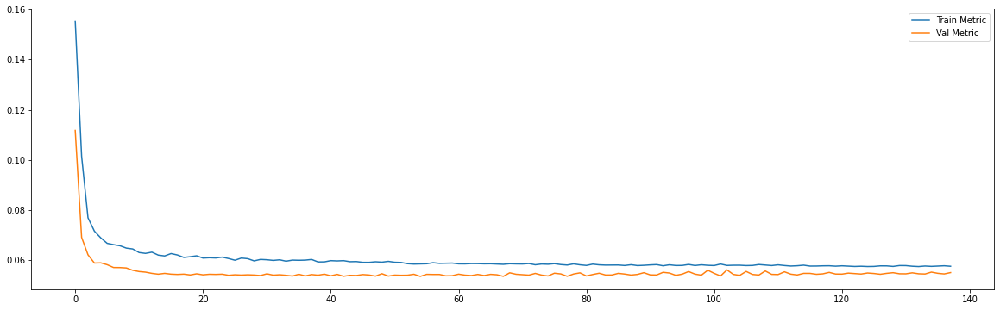

Epoch 00132: early stopping
============================model:5===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0579
loss and metric train data [0.00619508558884263, 0.05785389617085457]
7/7 [==============================] - 0s 5ms/step - loss: 0.0052 - mae: 0.0557
loss and metric val data [0.005163266789168119, 0.05573362857103348]
7/7 [==============================] - 0s 5ms/step - loss: 0.0086 - mae: 0.0720
loss and metric test data [0.008634518831968307, 0.07197047770023346]


'neurons': 30, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




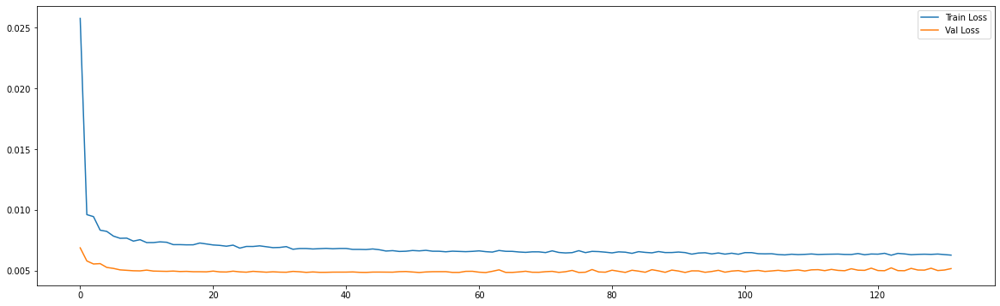

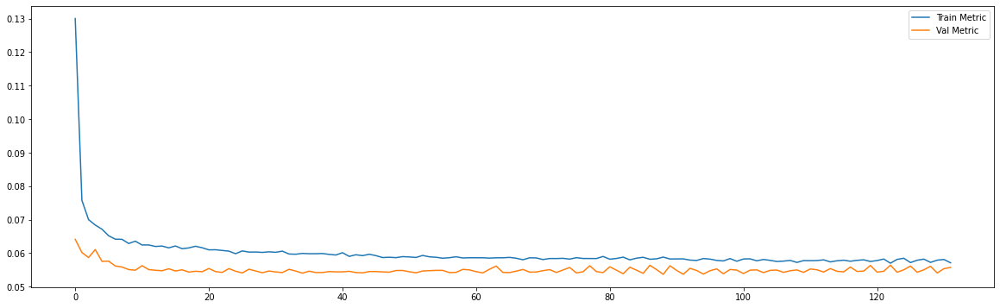

Epoch 00192: early stopping
============================model:6===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0071 - mae: 0.0620
loss and metric train data [0.007126842625439167, 0.06196347624063492]
3/3 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0658
loss and metric val data [0.00717995734885335, 0.0657750815153122]
3/3 [==============================] - 0s 4ms/step - loss: 0.0145 - mae: 0.0937
loss and metric test data [0.014533842913806438, 0.09374108165502548]


'neurons': 30, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




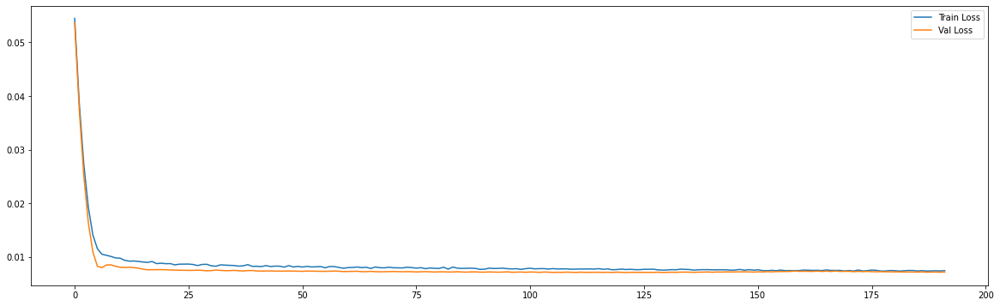

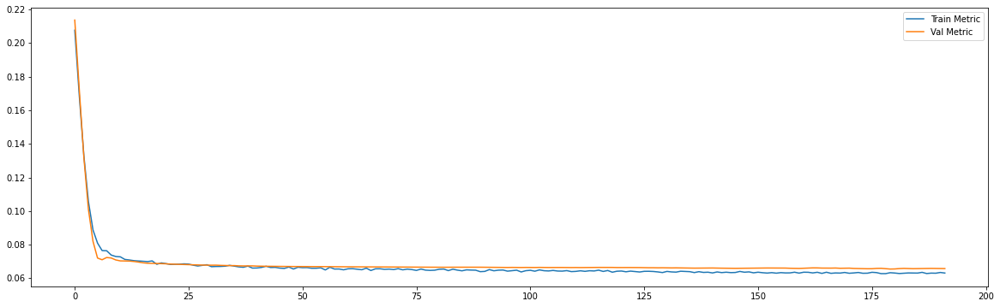

Epoch 00204: early stopping
============================model:7===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0616
loss and metric train data [0.007115968968719244, 0.061558861285448074]
3/3 [==============================] - 0s 6ms/step - loss: 0.0075 - mae: 0.0675
loss and metric val data [0.007492499891668558, 0.0675206184387207]
3/3 [==============================] - 0s 6ms/step - loss: 0.0145 - mae: 0.0942
loss and metric test data [0.014516458846628666, 0.09422989934682846]


'neurons': 30, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




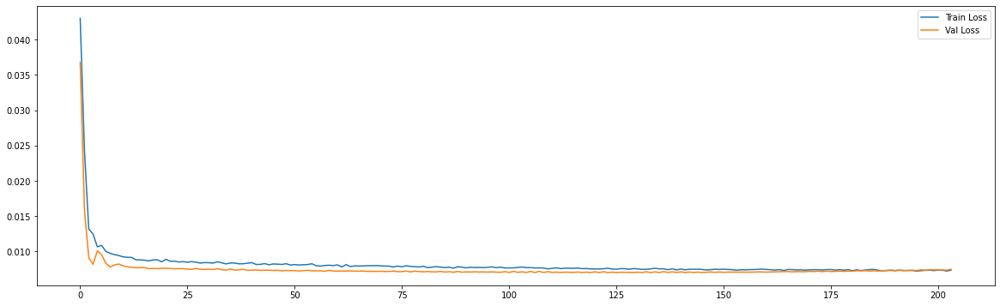

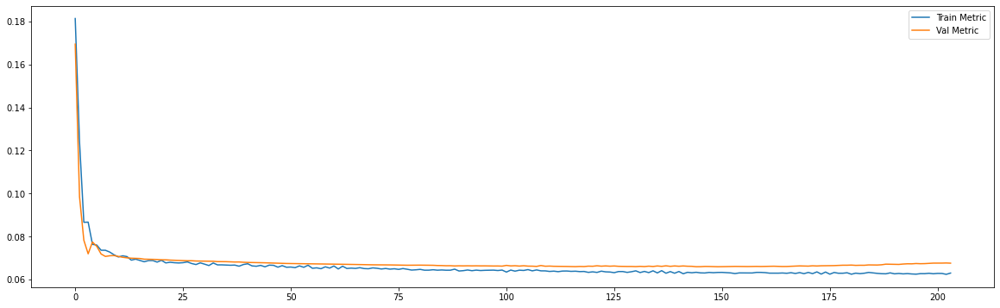

Epoch 00352: early stopping
============================model:8===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0559
loss and metric train data [0.005734797101467848, 0.05587596818804741]
9/9 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0560
loss and metric val data [0.005053830333054066, 0.05603290721774101]
9/9 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0571
loss and metric test data [0.005972553510218859, 0.0571410171687603]


'neurons': 30, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




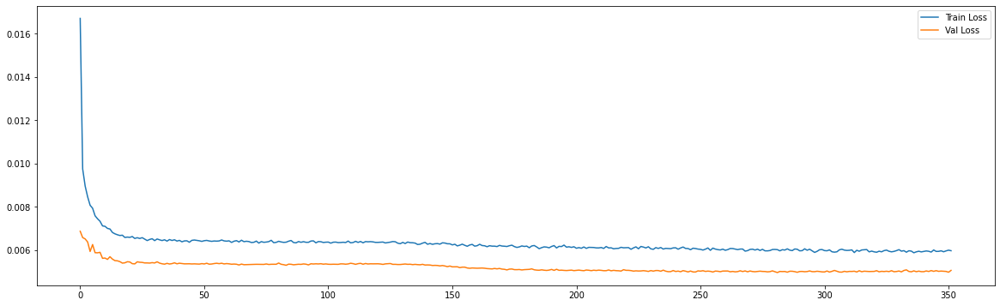

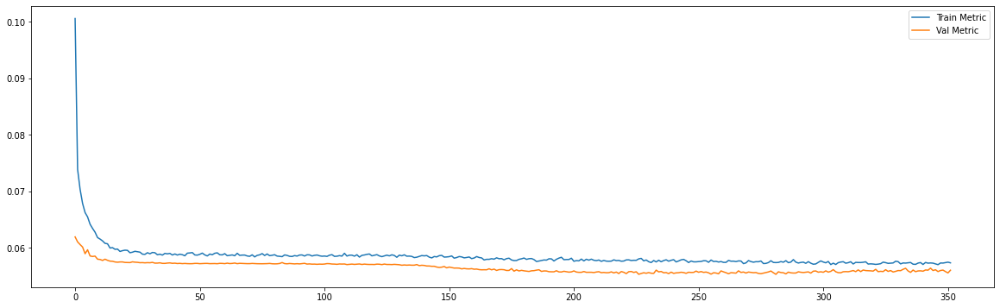

Epoch 00107: early stopping
============================model:9===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0569
loss and metric train data [0.006199253257364035, 0.05690574273467064]
9/9 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0574
loss and metric val data [0.005385959055274725, 0.057396240532398224]
9/9 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0588
loss and metric test data [0.006442179437726736, 0.058761950582265854]


'neurons': 30, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




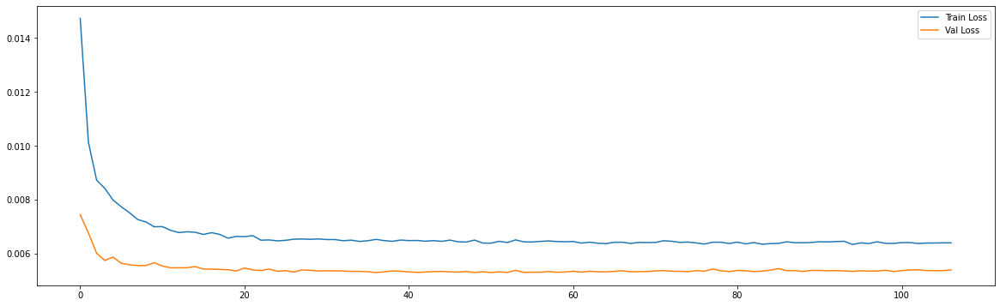

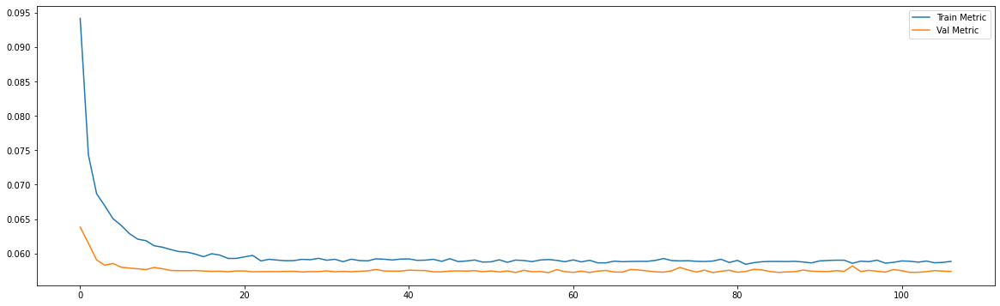

Epoch 00116: early stopping
============================model:10===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0570
loss and metric train data [0.006116736680269241, 0.05701523274183273]
8/8 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0559
loss and metric val data [0.005116881802678108, 0.05593980848789215]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0630
loss and metric test data [0.007063054013997316, 0.06297087669372559]


'neurons': 30, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




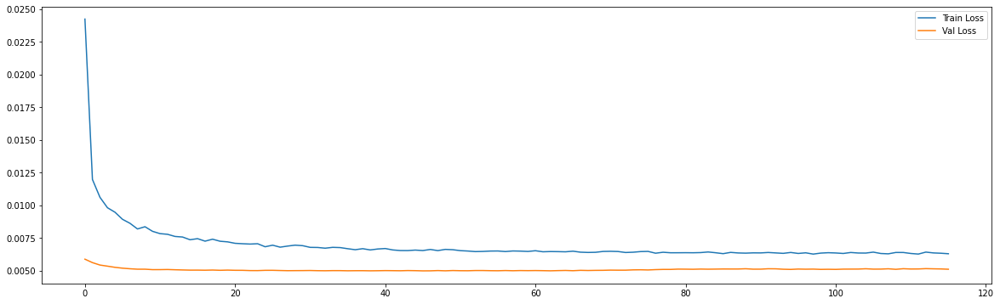

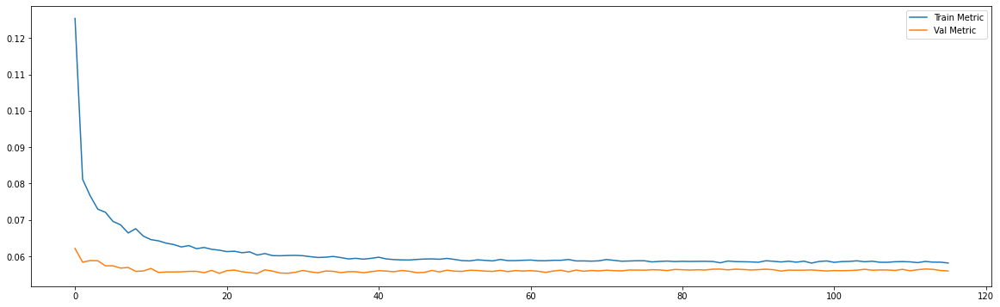

Epoch 00118: early stopping
============================model:11===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0574
loss and metric train data [0.006113769952207804, 0.0573759488761425]
8/8 [==============================] - 0s 5ms/step - loss: 0.0052 - mae: 0.0564
loss and metric val data [0.005166132468730211, 0.05641952529549599]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0636
loss and metric test data [0.007131047546863556, 0.06357632577419281]


'neurons': 30, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




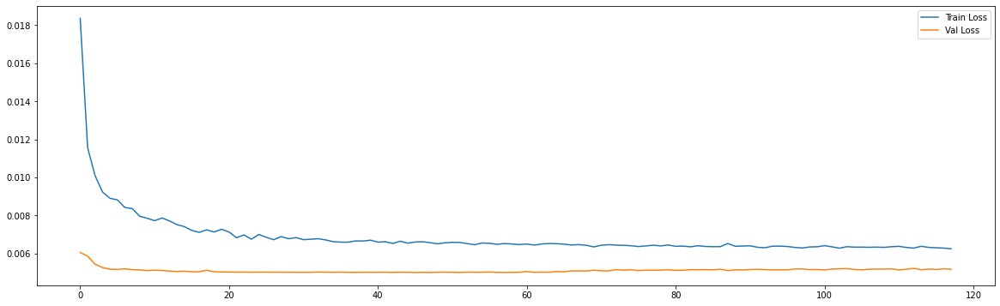

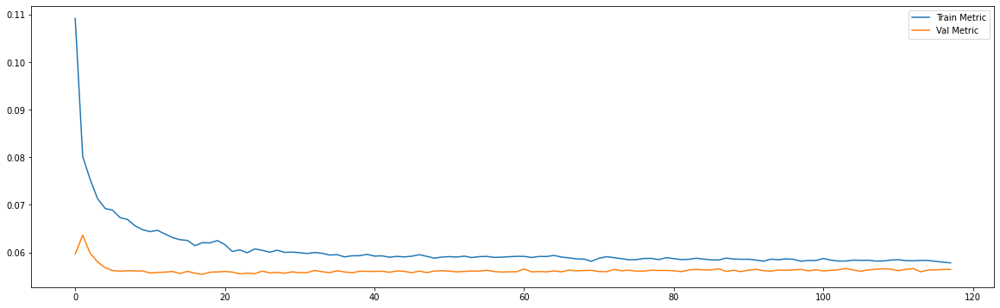

Epoch 00156: early stopping
============================model:12===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0568
loss and metric train data [0.006177728530019522, 0.05678536742925644]
7/7 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0543
loss and metric val data [0.004982735961675644, 0.05433882027864456]
7/7 [==============================] - 0s 4ms/step - loss: 0.0086 - mae: 0.0705
loss and metric test data [0.008551927283406258, 0.07046622782945633]


'neurons': 30, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




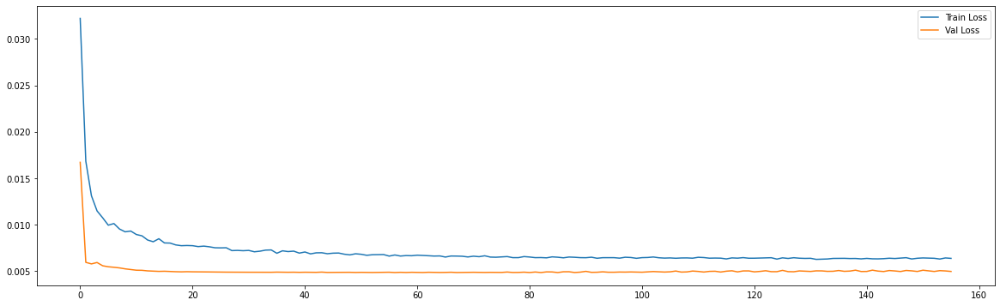

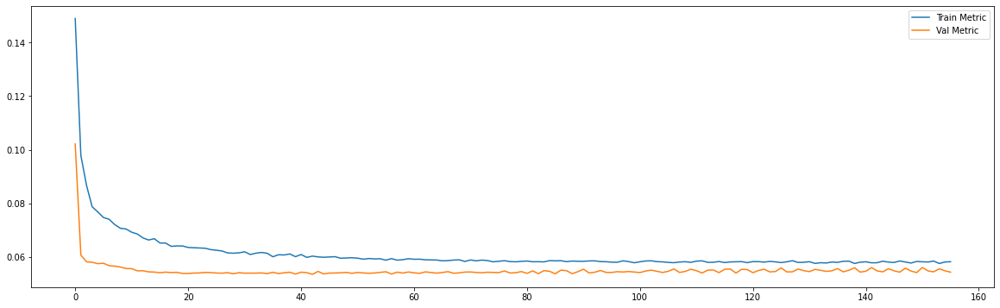

Epoch 00136: early stopping
============================model:13===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0579
loss and metric train data [0.00619749678298831, 0.05787385255098343]
7/7 [==============================] - 0s 5ms/step - loss: 0.0052 - mae: 0.0560
loss and metric val data [0.005150731652975082, 0.05597018077969551]
7/7 [==============================] - 0s 5ms/step - loss: 0.0086 - mae: 0.0717
loss and metric test data [0.008629529736936092, 0.07168727368116379]


'neurons': 30, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




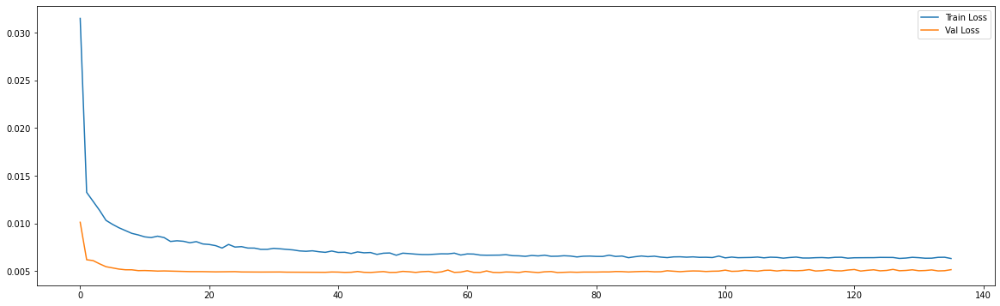

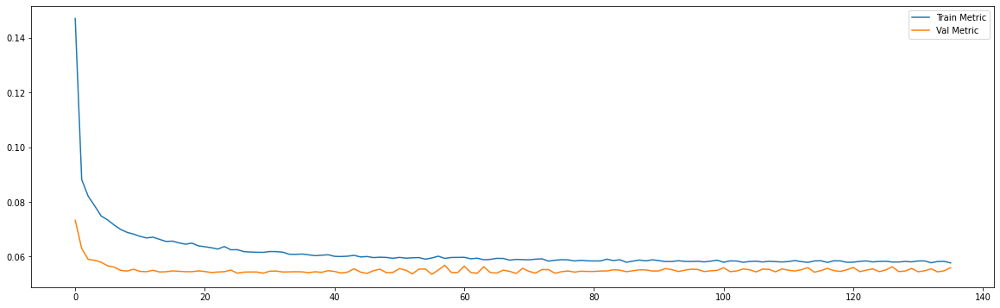

Epoch 00369: early stopping
============================model:14===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0071 - mae: 0.0618
loss and metric train data [0.0071125756949186325, 0.0618252195417881]
3/3 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0663
loss and metric val data [0.00718630850315094, 0.06631523370742798]
3/3 [==============================] - 0s 4ms/step - loss: 0.0146 - mae: 0.0939
loss and metric test data [0.014630609191954136, 0.09387007355690002]


'neurons': 30, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




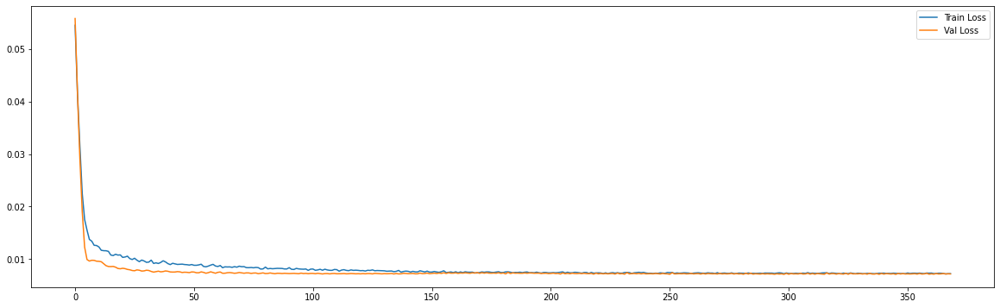

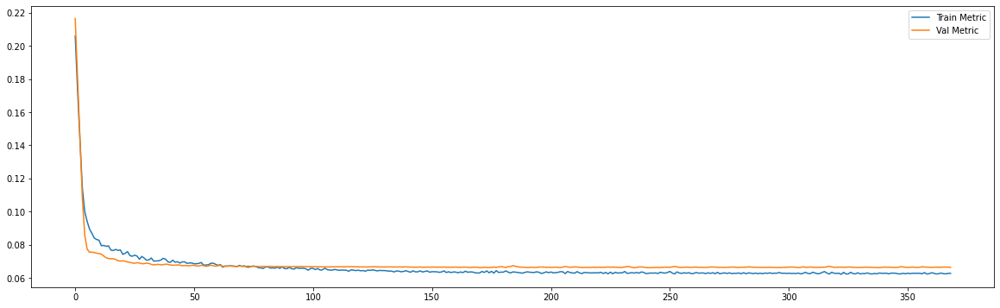

Epoch 00209: early stopping
============================model:15===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0618
loss and metric train data [0.007115560118108988, 0.061785243451595306]
3/3 [==============================] - 0s 7ms/step - loss: 0.0074 - mae: 0.0669
loss and metric val data [0.0073955850675702095, 0.06686168909072876]
3/3 [==============================] - 0s 6ms/step - loss: 0.0144 - mae: 0.0939
loss and metric test data [0.014408668503165245, 0.093928262591362]


'neurons': 30, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




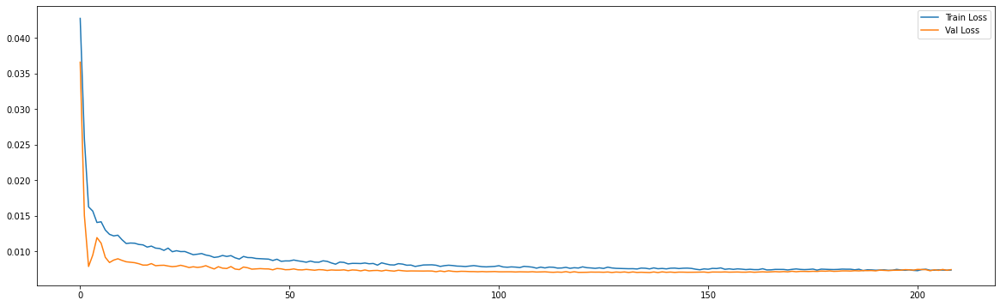

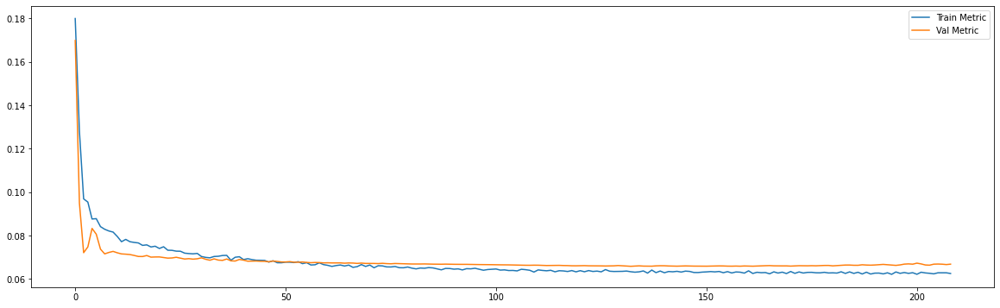

Epoch 00106: early stopping
============================model:16===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0063 - mae: 0.0569
loss and metric train data [0.006256979424506426, 0.056911103427410126]
9/9 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0571
loss and metric val data [0.005463466979563236, 0.0570940263569355]
9/9 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0588
loss and metric test data [0.006512955762445927, 0.05882023274898529]


'neurons': 50, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




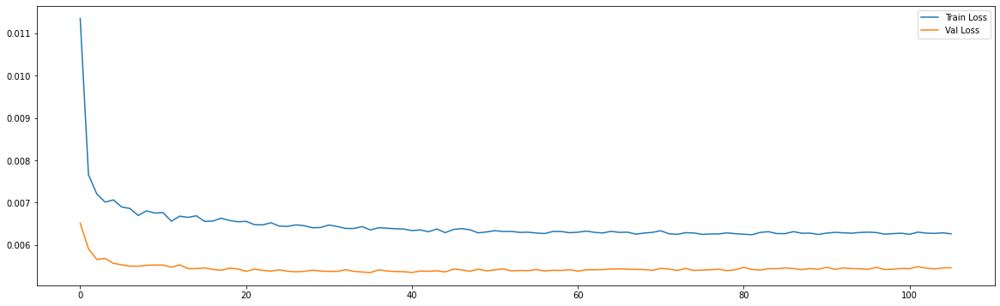

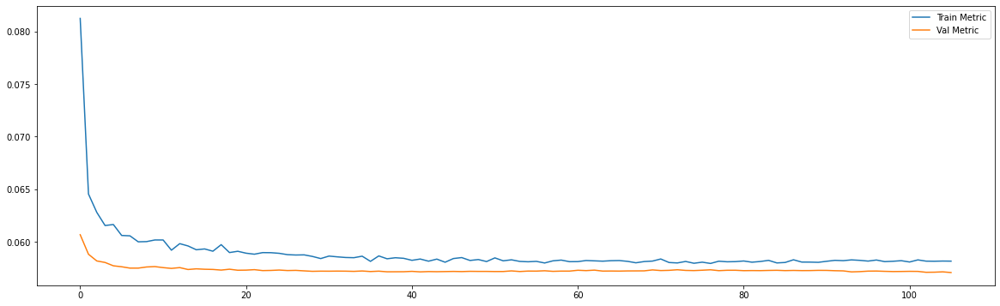

Epoch 00191: early stopping
============================model:17===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0561
loss and metric train data [0.005741220433264971, 0.056099649518728256]
9/9 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0562
loss and metric val data [0.005108666606247425, 0.05615371838212013]
9/9 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0570
loss and metric test data [0.006195732858031988, 0.05698051303625107]


'neurons': 50, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




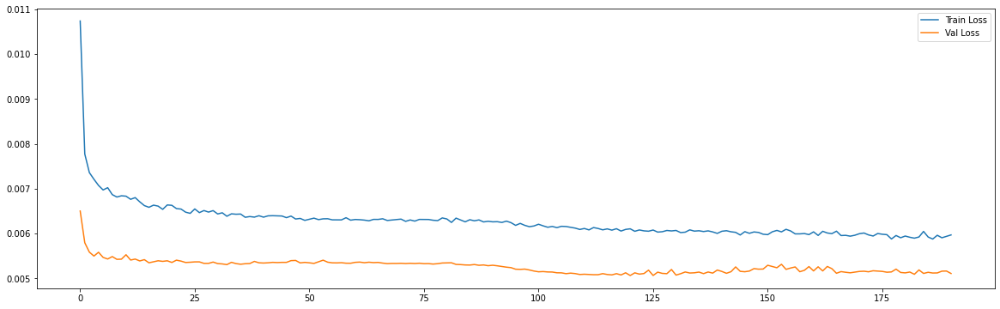

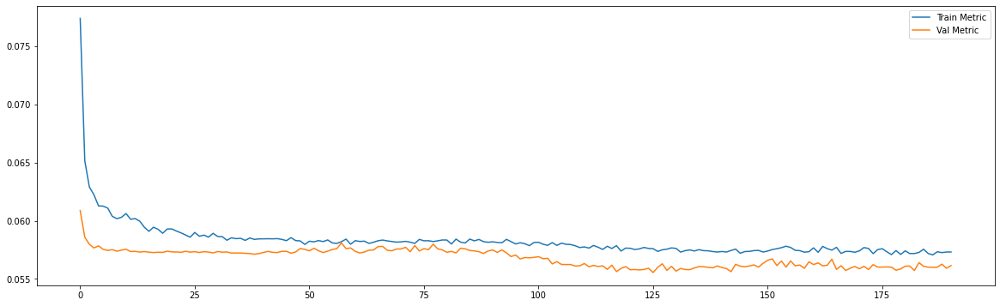

Epoch 00103: early stopping
============================model:18===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0570
loss and metric train data [0.006112401373684406, 0.057036299258470535]
8/8 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0560
loss and metric val data [0.0051520452834665775, 0.05596843361854553]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0634
loss and metric test data [0.007145698647946119, 0.06336623430252075]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




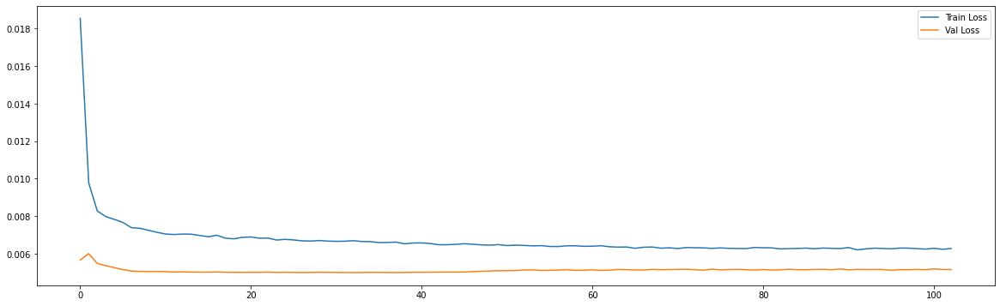

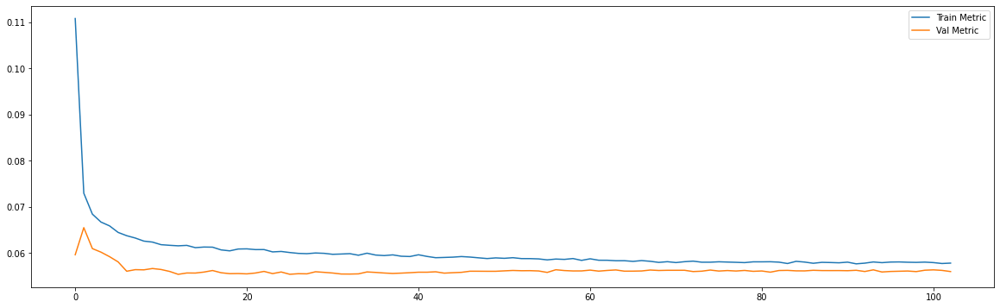

Epoch 00100: early stopping
============================model:19===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0573
loss and metric train data [0.006113240495324135, 0.057295188307762146]
8/8 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0562
loss and metric val data [0.005212051793932915, 0.056247055530548096]
8/8 [==============================] - 0s 3ms/step - loss: 0.0073 - mae: 0.0641
loss and metric test data [0.0072913807816803455, 0.06407713145017624]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




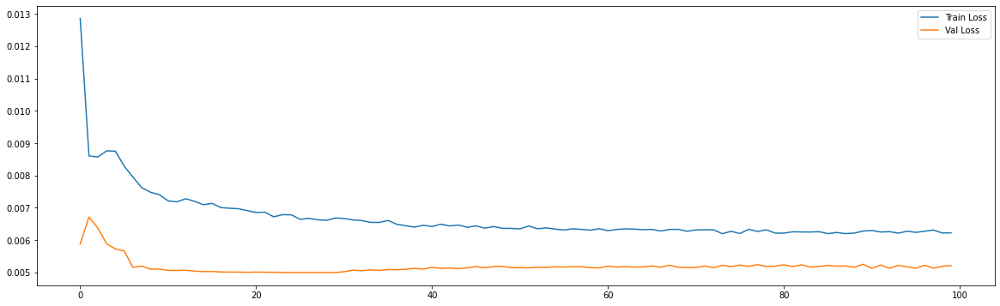

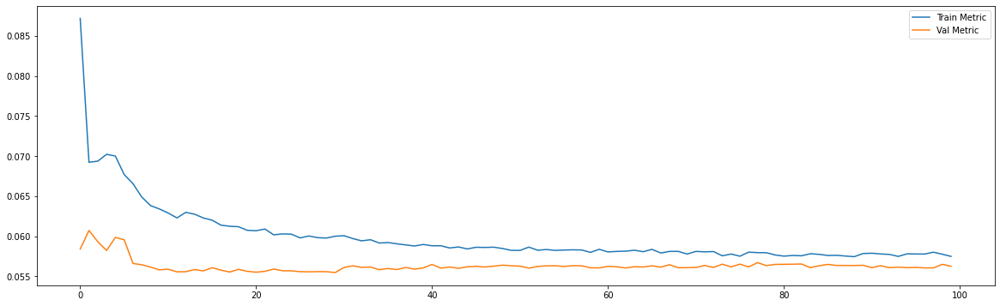

Epoch 00125: early stopping
============================model:20===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0570
loss and metric train data [0.006142594385892153, 0.05695464834570885]
7/7 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0546
loss and metric val data [0.005024787504225969, 0.05462390184402466]
7/7 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0711
loss and metric test data [0.008560620248317719, 0.07106762379407883]


'neurons': 50, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




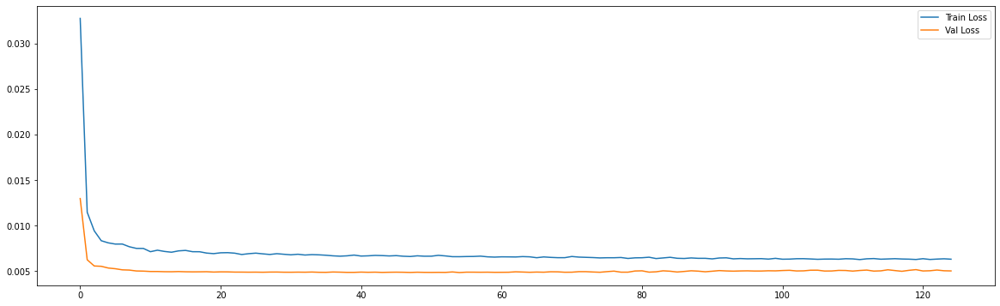

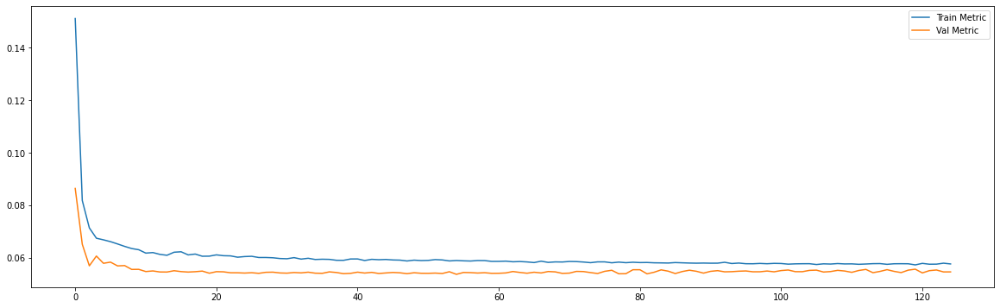

Epoch 00104: early stopping
============================model:21===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0061 - mae: 0.0571
loss and metric train data [0.006133294198662043, 0.05711818486452103]
7/7 [==============================] - 0s 5ms/step - loss: 0.0051 - mae: 0.0549
loss and metric val data [0.005067269317805767, 0.05490661785006523]
7/7 [==============================] - 0s 5ms/step - loss: 0.0086 - mae: 0.0716
loss and metric test data [0.008646591566503048, 0.0716187059879303]


'neurons': 50, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




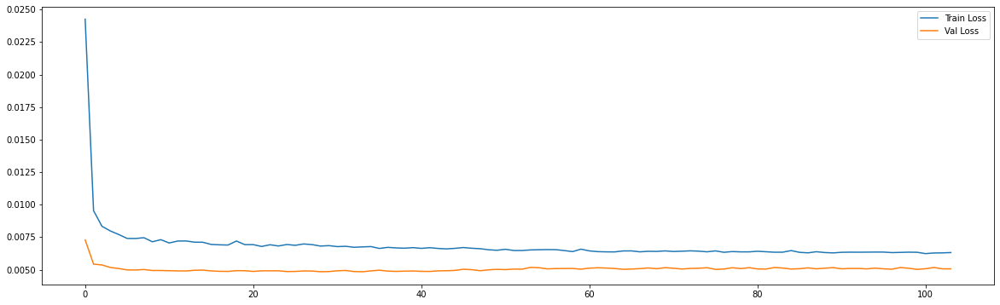

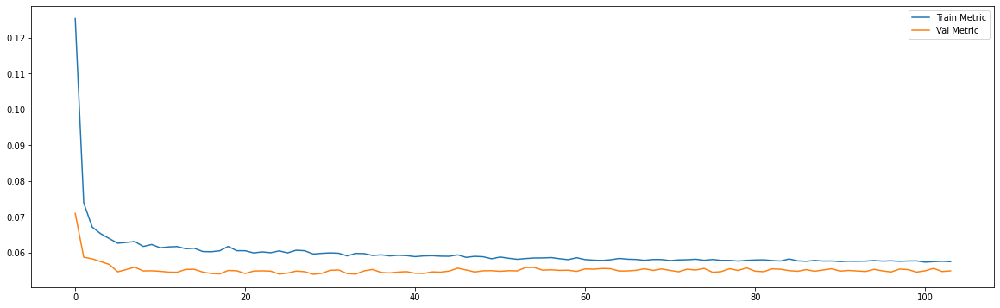

Epoch 00180: early stopping
============================model:22===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0071 - mae: 0.0618
loss and metric train data [0.007111529819667339, 0.06177037954330444]
3/3 [==============================] - 0s 4ms/step - loss: 0.0074 - mae: 0.0663
loss and metric val data [0.007363107521086931, 0.06633250415325165]
3/3 [==============================] - 0s 5ms/step - loss: 0.0144 - mae: 0.0940
loss and metric test data [0.014415949583053589, 0.09398673474788666]


'neurons': 50, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




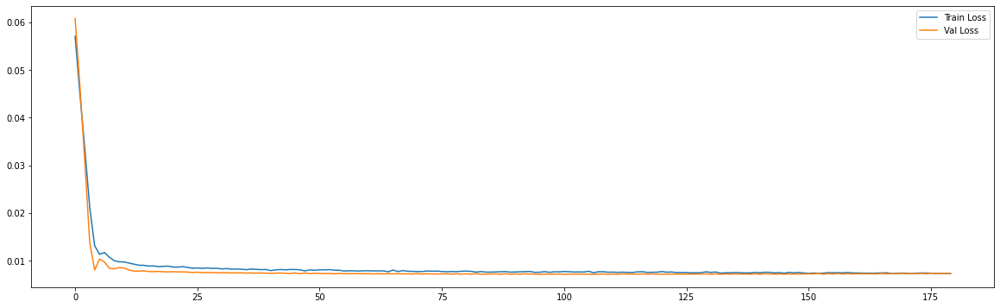

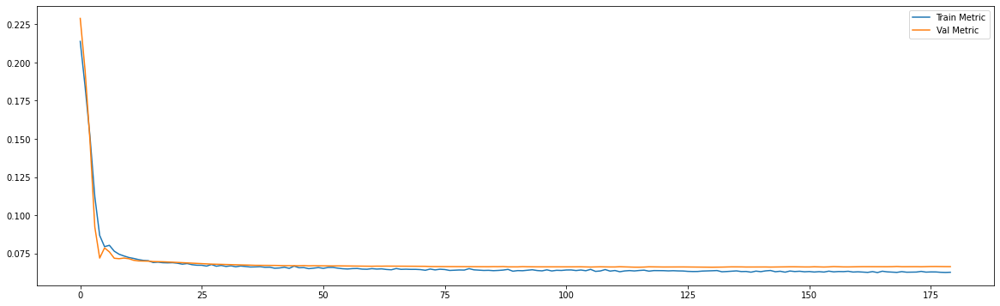

Epoch 00168: early stopping
============================model:23===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0623
loss and metric train data [0.00713235093280673, 0.06232409551739693]
3/3 [==============================] - 0s 6ms/step - loss: 0.0072 - mae: 0.0663
loss and metric val data [0.0072495113126933575, 0.06631892919540405]
3/3 [==============================] - 0s 6ms/step - loss: 0.0143 - mae: 0.0935
loss and metric test data [0.014308786951005459, 0.0934760719537735]


'neurons': 50, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




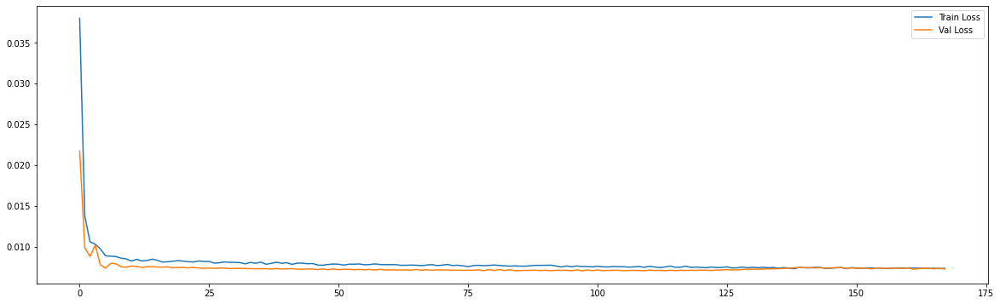

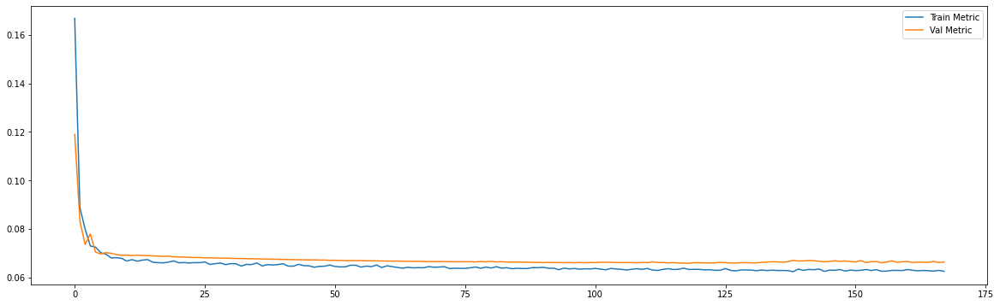

Epoch 00110: early stopping
============================model:24===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0567
loss and metric train data [0.006183292251080275, 0.056748244911432266]
9/9 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0568
loss and metric val data [0.005374651402235031, 0.056768689304590225]
9/9 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0589
loss and metric test data [0.0063990275375545025, 0.058854151517152786]


'neurons': 50, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




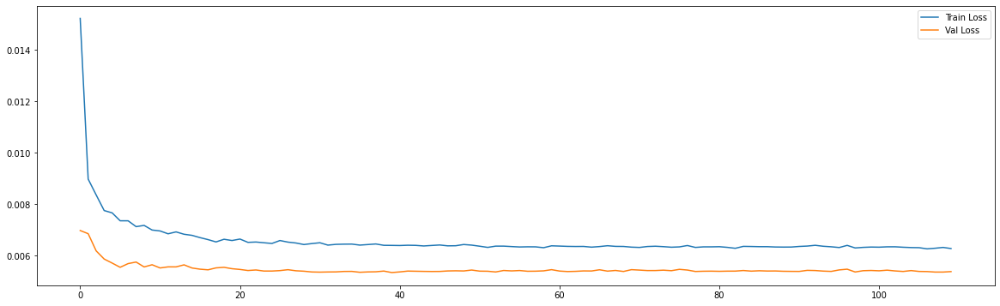

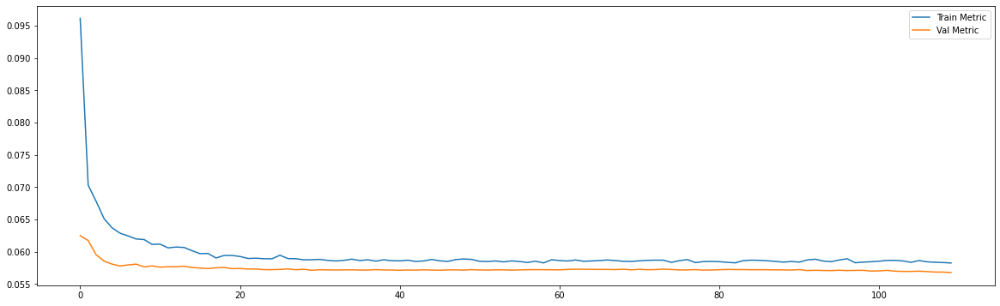

Epoch 00207: early stopping
============================model:25===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0561
loss and metric train data [0.005773068871349096, 0.05614829808473587]
9/9 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0560
loss and metric val data [0.005086684599518776, 0.05598745867609978]
9/9 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0568
loss and metric test data [0.005989250726997852, 0.05676314979791641]


'neurons': 50, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




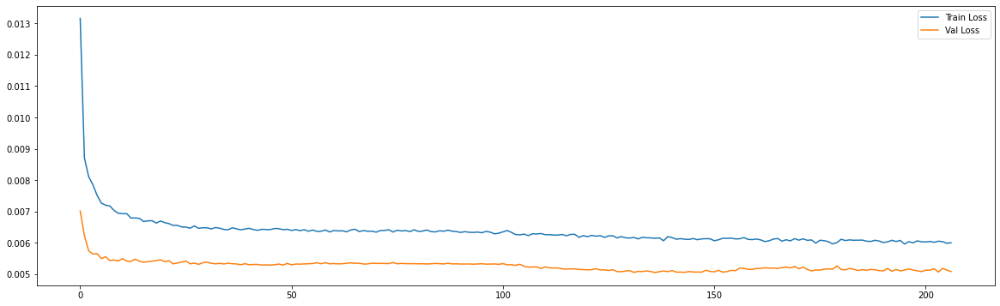

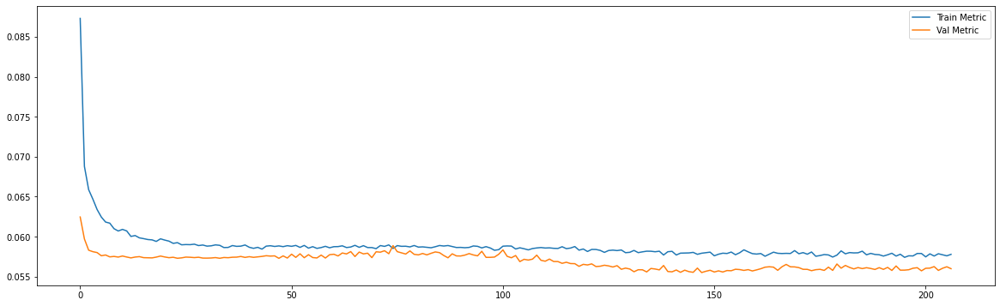

Epoch 00123: early stopping
============================model:26===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0571
loss and metric train data [0.006090645212680101, 0.05714060366153717]
8/8 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0562
loss and metric val data [0.005149564240127802, 0.05617412179708481]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0633
loss and metric test data [0.007102750241756439, 0.06333981454372406]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




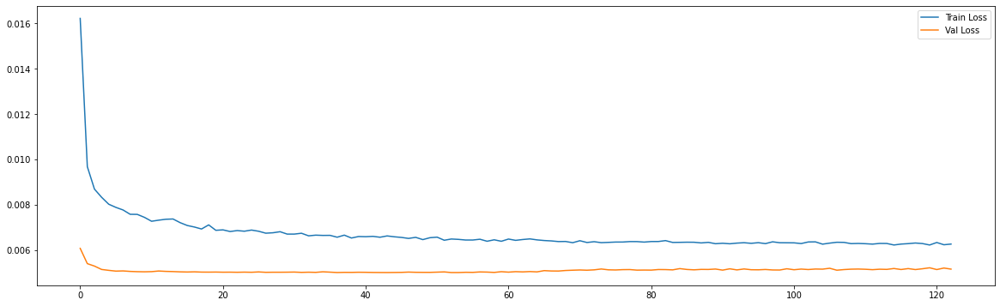

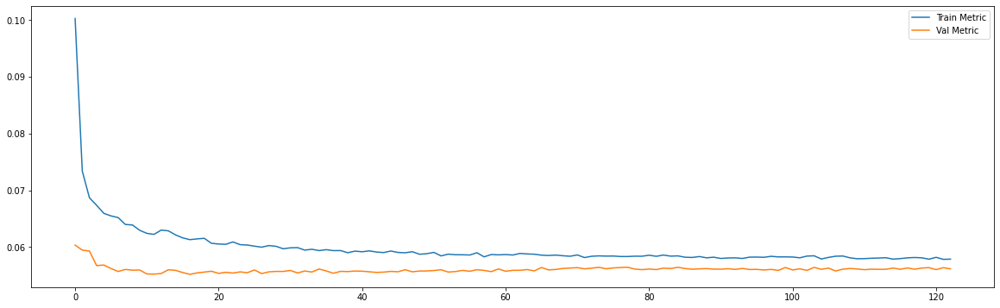

Epoch 00107: early stopping
============================model:27===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0062 - mae: 0.0574
loss and metric train data [0.006182545330375433, 0.0574461966753006]
8/8 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0560
loss and metric val data [0.005229160189628601, 0.056025754660367966]
8/8 [==============================] - 0s 3ms/step - loss: 0.0077 - mae: 0.0659
loss and metric test data [0.007685994729399681, 0.06587329506874084]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




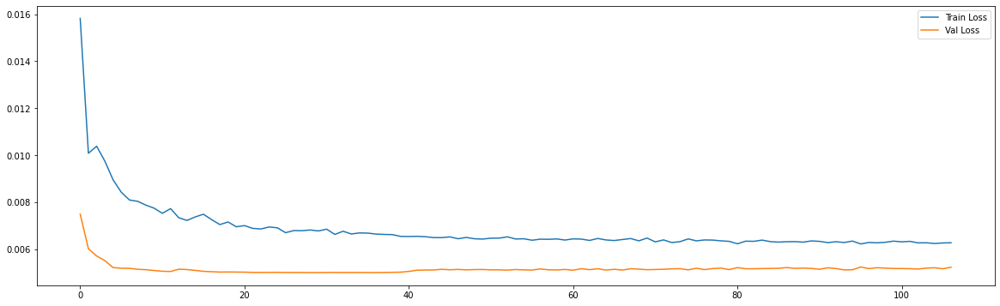

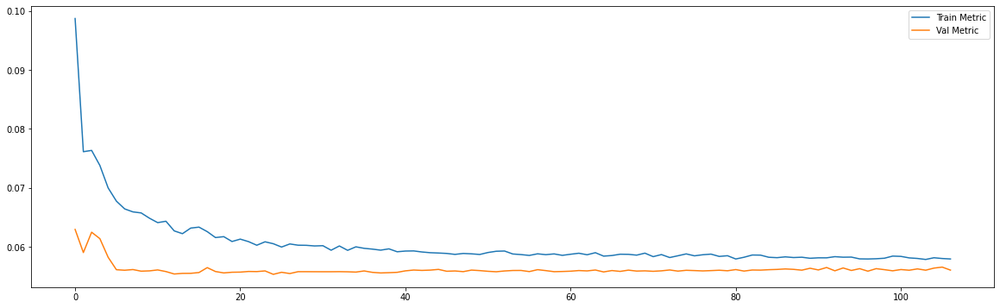

Epoch 00104: early stopping
============================model:28===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0574
loss and metric train data [0.006165786180645227, 0.05735567957162857]
7/7 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0551
loss and metric val data [0.005057487636804581, 0.055073440074920654]
7/7 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0712
loss and metric test data [0.008572297170758247, 0.071226567029953]


'neurons': 50, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




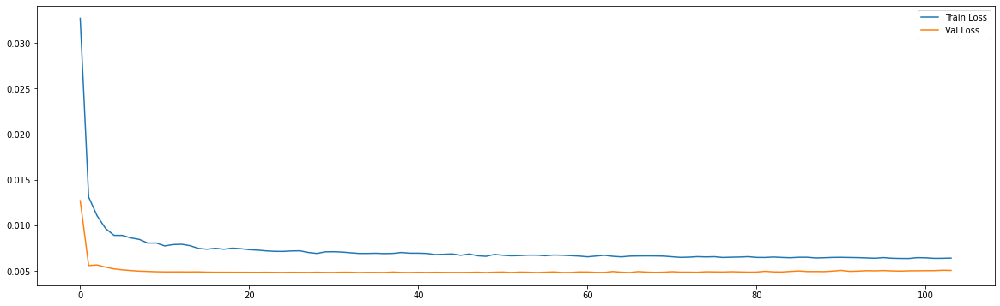

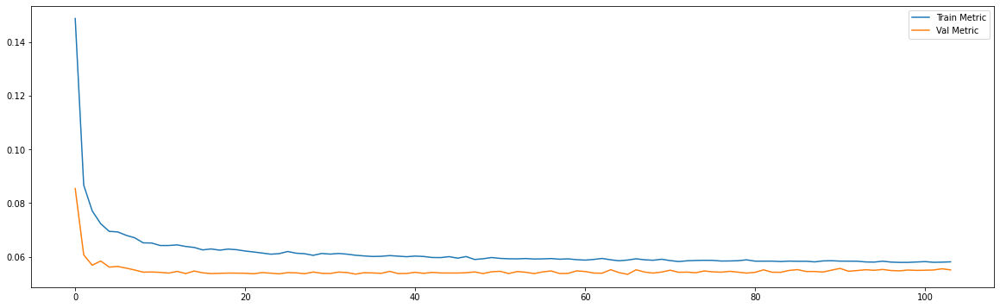

Epoch 00100: early stopping
============================model:29===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0061 - mae: 0.0573
loss and metric train data [0.006147709209471941, 0.05729711800813675]
7/7 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0550
loss and metric val data [0.005097059532999992, 0.05502047389745712]
7/7 [==============================] - 0s 4ms/step - loss: 0.0087 - mae: 0.0721
loss and metric test data [0.008712858892977238, 0.07214245200157166]


'neurons': 50, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




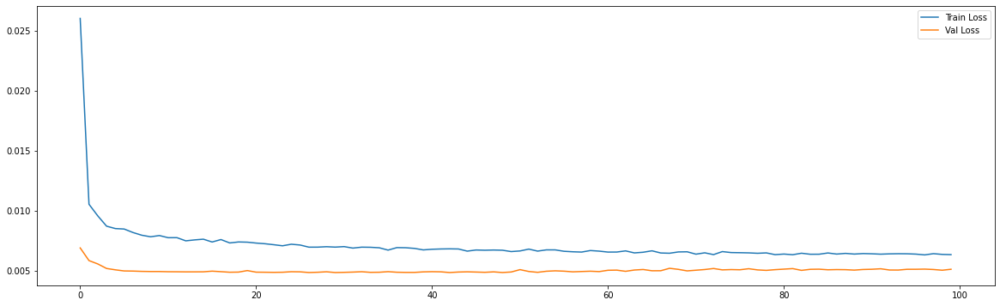

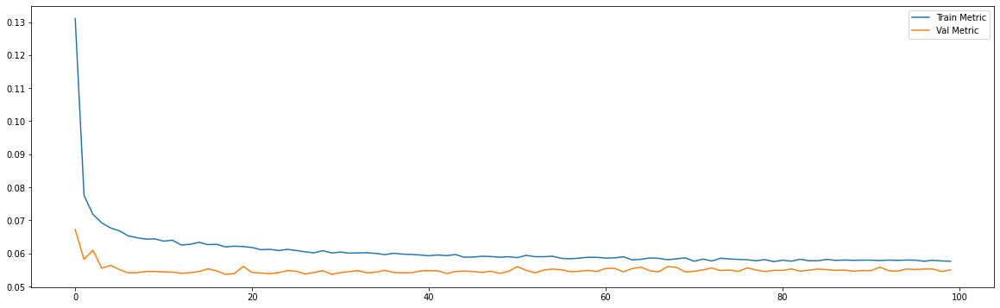

Epoch 00168: early stopping
============================model:30===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0071 - mae: 0.0620
loss and metric train data [0.007124312222003937, 0.06202703341841698]
3/3 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0661
loss and metric val data [0.007325445301830769, 0.06607864052057266]
3/3 [==============================] - 0s 4ms/step - loss: 0.0145 - mae: 0.0938
loss and metric test data [0.014506842009723186, 0.09381697326898575]


'neurons': 50, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




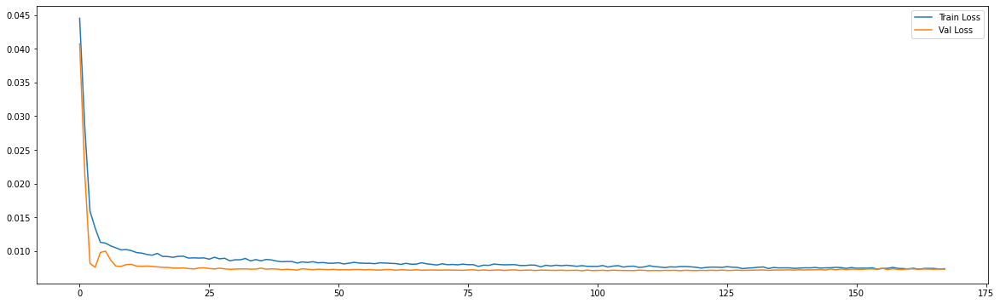

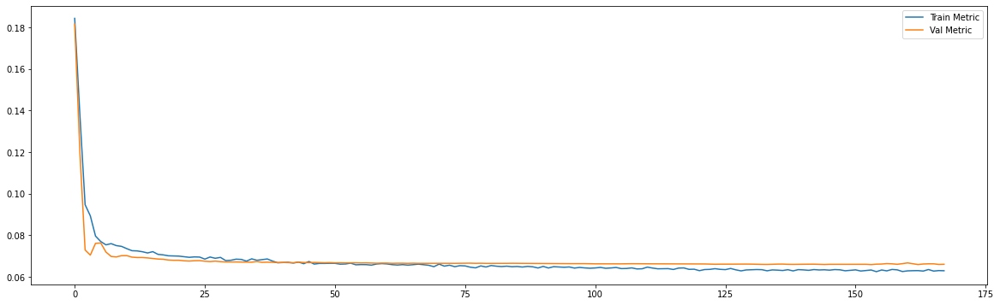

Epoch 00157: early stopping
============================model:31===========================
32/32 [==============================] - 1s 33ms/step - loss: 0.0072 - mae: 0.0619
loss and metric train data [0.007174868602305651, 0.061945591121912]
3/3 [==============================] - 0s 7ms/step - loss: 0.0071 - mae: 0.0661
loss and metric val data [0.007143847178667784, 0.06612954288721085]
3/3 [==============================] - 0s 6ms/step - loss: 0.0149 - mae: 0.0946
loss and metric test data [0.014863846823573112, 0.09461041539907455]


'neurons': 50, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




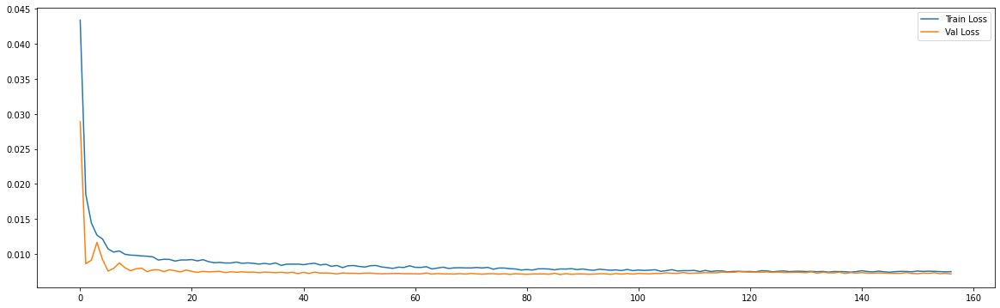

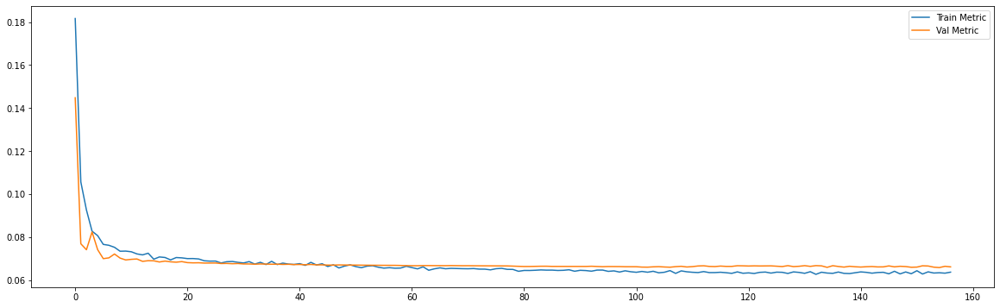

In [9]:
future_steps = 5
n_features = 1

neurons_list = [30,50]
dropout_list = [0.2,0.4]
time_steps_list = [30,60,120,240]
lr_list = [0.001]
models = {}
i=0
for neurons in neurons_list:
  for dropout in dropout_list:
    for time_steps in time_steps_list:
      for lr in lr_list:
        x_train,x_test,x_val,y_train,y_val,y_test = Regressor(future_steps = future_steps,time_steps = time_steps,n_features = n_features,df_train = df_train_norm,df_val = df_val_norm,df_test = df_test_norm)

        models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':time_steps, 'learning_rate':lr}
        models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'learning_rate':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,time_steps,lr,1)

        # The LSTM architecture
        models[i]['model'] = Sequential()
        models[i]['model'].add(LSTM(units=neurons, return_sequences=False,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(Dense(units=future_steps))

        #Compiling the LSTM
        adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
        models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

        # early stop
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 70)

        #Fitting to traning set
        history = models[i]['model'].fit(x_train, y_train, validation_data = (x_val,y_val), epochs = 500, batch_size = time_steps, verbose = 0, shuffle = False, callbacks = [es])

        print('============================model:{}==========================='.format(i))

          
        print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
        print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
        print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
        print('\n')

        print(models[i]['resumo'])
        print('\n')

        plt.figure(figsize=(20,6))
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.legend(['Train Loss', 'Val Loss'])

        plt.figure(figsize=(20,6))
        plt.plot(history.history['mae'])
        plt.plot(history.history['val_mae'])
        plt.legend(['Train Metric', 'Val Metric'])
        plt.show()

        i+=1


        models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':time_steps}
        models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,time_steps,2)

        # The LSTM architecture
        models[i]['model'] = Sequential()
        models[i]['model'].add(LSTM(units=neurons, return_sequences=True,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(LSTM(units=neurons, return_sequences=False))
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(Dense(units=future_steps))

        #Compiling the LSTM
        adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
        models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

         # early stop
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 70)

        #Fitting to traning set
        history = models[i]['model'].fit(x_train, y_train, validation_data = (x_val,y_val), epochs = 500, batch_size = time_steps, verbose = 0, shuffle = False, callbacks = [es])

        print('============================model:{}==========================='.format(i))

          
        print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
        print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
        print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
        print('\n')

        print(models[i]['resumo'])
        print('\n')

        plt.figure(figsize=(20,6))
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.legend(['Train Loss', 'Val Loss'])

        plt.figure(figsize=(20,6))
        plt.plot(history.history['mae'])
        plt.plot(history.history['val_mae'])
        plt.legend(['Train Metric', 'Val Metric'])
        plt.show()

        i+=1